Creating Fourier modes:  (150, 150)
Calibration modes required: 2688


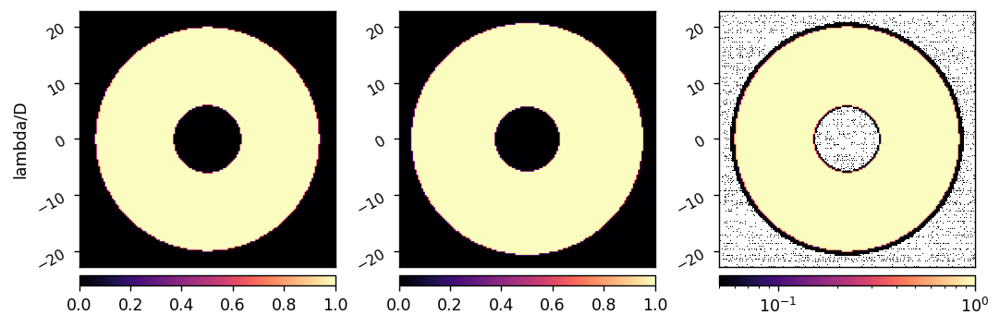

Calibrating I-EFC...
	Calibrated mode 1 / 2688 in 5.807s
	Calibrated mode 2 / 2688 in 11.582s
Calibration interrupted.
Calibration complete.
Saved data to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/response-data/spc_wide_2dm_annular_6to20
Saved data to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/calibration-data/spc_wide_2dm_annular_6to20


In [7]:
import spc_wide_iefc_calibration

In [49]:
import numpy as np
import cupy as cp
import astropy.units as u
from astropy.io import fits
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload

import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('INFO')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)

poppy_log.disabled = True

import warnings
warnings.filterwarnings("ignore")

import cgi_phasec_poppy as cgi
from cgi_phasec_poppy import misc

from wfsc import iefc_2dm as iefc
from wfsc import utils

In [3]:
cgi.__file__

'/home/u21/kianmilani/src/cgi-phasec-poppy/cgi_phasec_poppy/__init__.py'

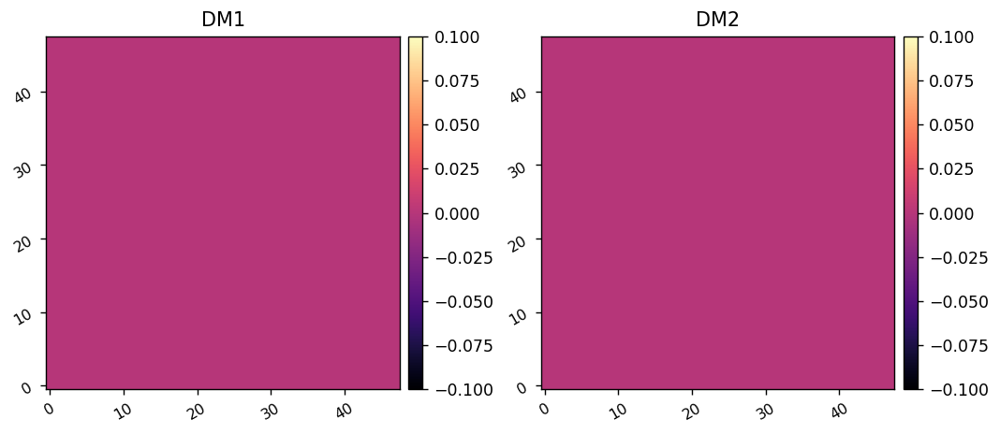

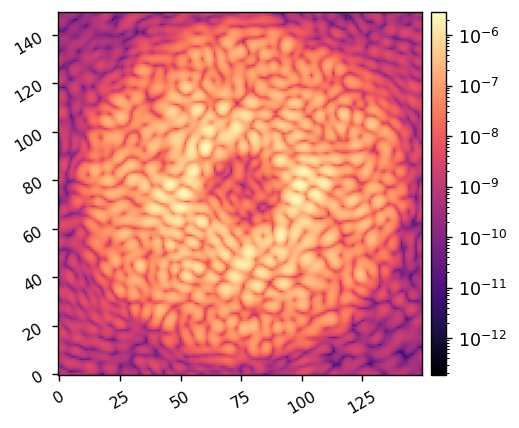

In [52]:
reload(cgi)
sysi = cgi.CGI(cgi_mode='spc-wide', npsf=150,
              use_fpm=True,
              use_pupil_defocus=True, 
              polaxis=0,
              use_opds=True,
             )
sysi.show_dms()

npsf = sysi.npsf
Nact = sysi.Nact

ref_psf = sysi.snap()

misc.myimshow(ref_psf, lognorm=True)

# Create dark hole ROI to calibrate and control

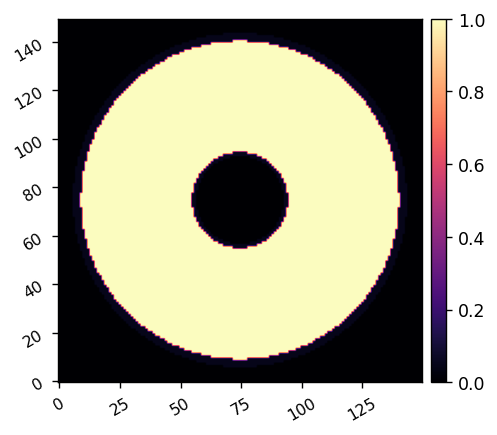

In [60]:
misc.myimshow(weights)

In [ ]:
reload(utils)
xfp = np.linspace(-0.5, 0.5, npsf) * npsf * sysi.psf_pixelscale_lamD
fpx,fpy = np.meshgrid(xfp,xfp)
fpr = np.sqrt(fpx**2 + fpy**2)

iwa = 5.4
owa = 20.8
control_params = {
    'inner_radius' : iwa,
    'outer_radius' : owa,
    'edge_position' : edge,
    'direction' : '+x',
    'rotation':rot,
    'full':True,
}
control_mask = utils.create_annular_focal_plane_mask(fpx, fpy, control_params)

# Create the mask that is used to select which region to make dark.
regions = [iwa, 6, 12, 20, owa]
weights = [0.1, 0.8, 1, 0.1]
weight_map = np.zeros(control_mask.shape, dtype=np.float64)
for i in range(len(weights)):
    roi_params = {
        'inner_radius' : regions[i],
        'outer_radius' : regions[i+1],
        'edge_position' : 0,
        'rotation':rot,
        'full':True,
    }
    roi = utils.create_annular_focal_plane_mask(fpx, fpy, roi_params)
    weight_map += roi*weights[i]

misc.myimshow2(control_mask, weight_map)

In [96]:
control_mask.any()

True

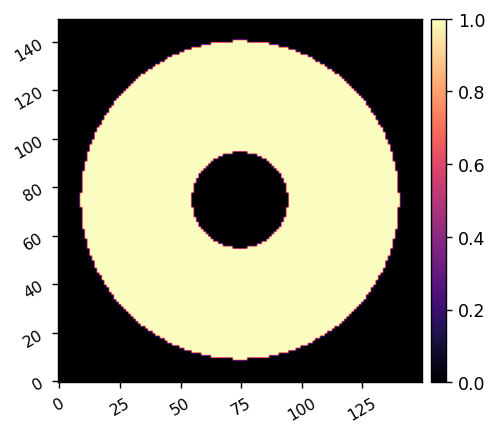

In [85]:
misc.myimshow((fpr>6)*(fpr<20))

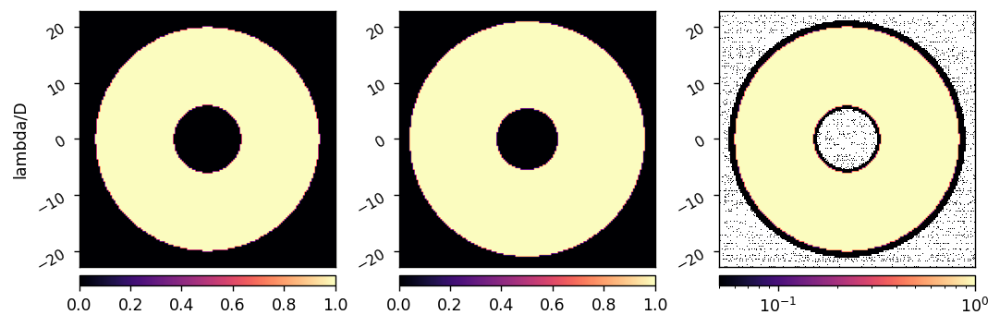

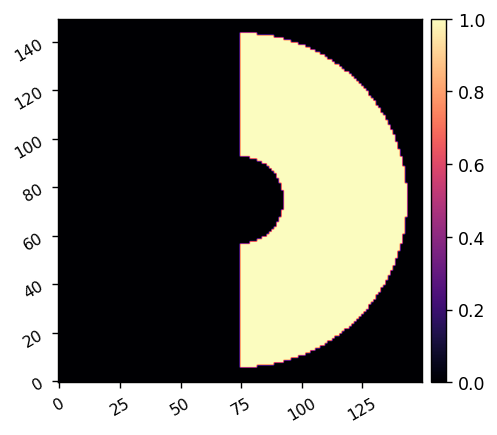

In [53]:
reload(utils)
xfp = np.linspace(-0.5, 0.5, npsf) * npsf * sysi.psf_pixelscale_lamD
fpx,fpy = np.meshgrid(xfp,xfp)

edge = 0
iwa = 6
owa = 20
rot = 0

# Create the mask that is used to select which region to make dark.
dh_params = {
    'inner_radius' : iwa,
    'outer_radius' : owa,
    'edge_position' : edge,
    'direction' : '+x',
    'rotation':rot,
    'full':True,
}
dh_mask = utils.create_annular_focal_plane_mask(xf, yf, dh_params)

#Create the mask that is used to select which region to make dark.
control_params = {
    'inner_radius' : iwa-0.5,
    'outer_radius' : owa+1,
    'edge_position' : edge,
    'rotation':rot,
    'full':True,
}
control_mask = utils.create_annular_focal_plane_mask(xf, yf, control_params)

relative_weight = 0.95
weights = dh_mask * relative_weight + (1 - relative_weight) * control_mask

misc.myimshow3(dh_mask,
               control_mask, 
               weights,
               lognorm3=True,
               pxscl1=sysi.psf_pixelscale_lamD, pxscl2=sysi.psf_pixelscale_lamD, pxscl3=sysi.psf_pixelscale_lamD)

half_params = {
    'inner_radius' : iwa-0.5,
    'outer_radius' : owa+1,
    'edge_position' : edge,
    'rotation':rot,
    'full':False,
}
half_mask = utils.create_annular_focal_plane_mask(xf, yf, half_params)
misc.myimshow(half_mask)

# Create probe and fourier modes

(1300, 2304) (650, 2)


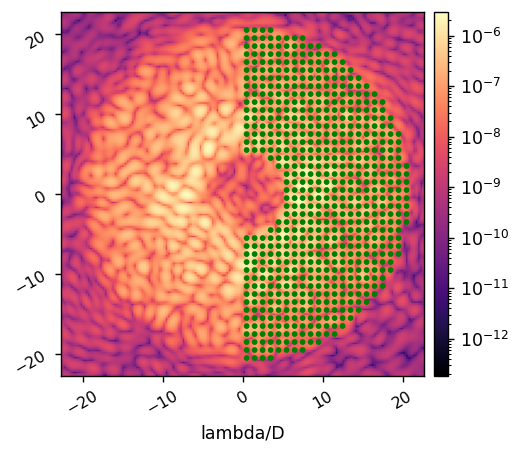

In [54]:
reload(utils)
calib_modes, fs = utils.select_fourier_modes(sysi, control_mask*(xf>0), fourier_sampling=1) 
nmodes = calib_modes.shape[0]
print(calib_modes.shape, fs.shape)

patches = []
for f in fs:
    center = (f[0], f[1])
    radius = 0.25
    patches.append(Circle(center, radius, fill=True, color='g'))
    
misc.myimshow(ref_psf, lognorm=True, pxscl=sysi.psf_pixelscale_lamD, patches=patches)

In [23]:
fs[calib_modes.shape[0]//4]

array([-20.825,   0.425])

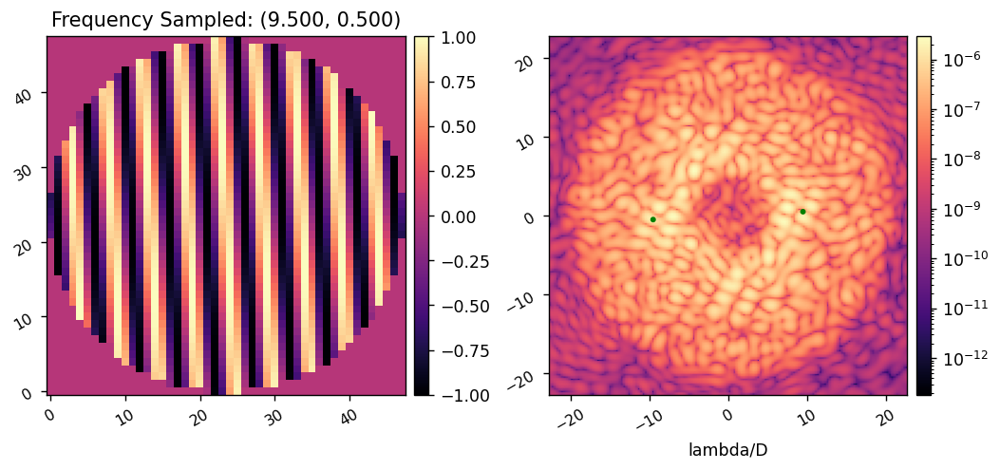

In [55]:
import time
for i in range(calib_modes.shape[0]//4, calib_modes.shape[0]//2):
    try:
        misc.myimshow2(calib_modes[i].reshape(Nact,Nact), ref_psf, 
                       'Frequency Sampled: ({:.3f}, {:.3f})'.format(fs[i][0], fs[i][1]),
                       lognorm2=True,
                       pxscl2=sysi.psf_pixelscale_lamD, 
                       patches2=[Circle(fs[i], 0.25, fill=True, color='g'),
                                 Circle(-fs[i], 0.25, fill=True, color='g')])
        clear_output(wait=True)
        time.sleep(0.25)
    except KeyboardInterrupt:
        break

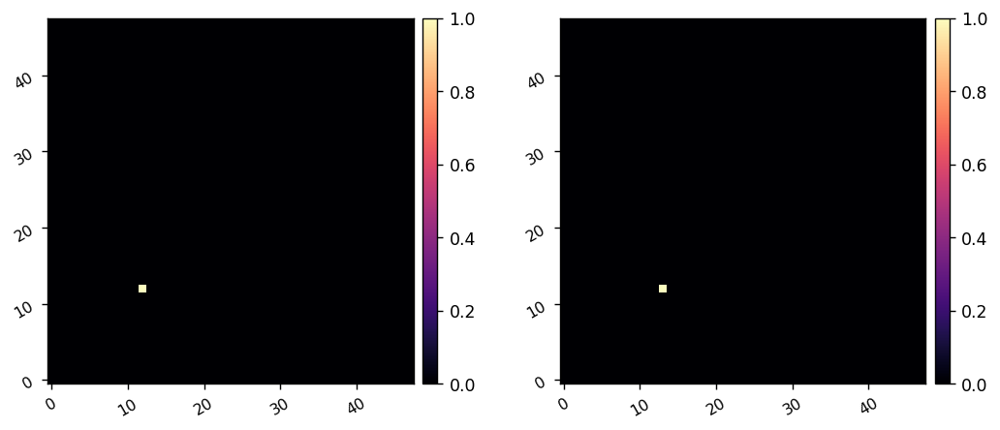

In [56]:
reload(iefc)
probe_modes = utils.create_probe_poke_modes(Nact, xinds=[Nact//4, Nact//4+1], yinds=[Nact//4, Nact//4], display=True)
# probe_modes = utils.create_fourier_probes(calib_modes, display_probes=True)

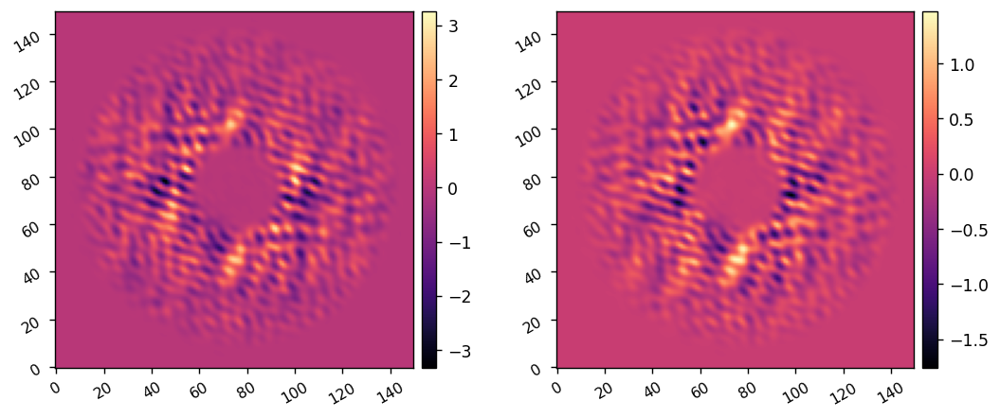

In [47]:
reload(iefc)

probe_amplitude = 3e-8
calibration_amplitude = 5e-9

sysi.reset_dms()
differential_images, single_images = iefc.take_measurement(sysi, 
                                                           probe_modes, probe_amplitude, 
                                                           return_all=True, display=True)

# Calibrate IEFC (or load in previous calibration data)

In [30]:
reload(iefc)
response_cube, calibration_cube = iefc.calibrate(sysi, 
                                                 probe_amplitude, probe_modes, 
                                                 calibration_amplitude, calibration_modes, start_mode=0)

Calibrating I-EFC...
	Calibrated mode 1 / 1408 in 11.947s
	Calibrated mode 2 / 1408 in 17.833s
	Calibrated mode 3 / 1408 in 23.768s
	Calibrated mode 4 / 1408 in 29.684s
	Calibrated mode 5 / 1408 in 35.631s
	Calibrated mode 6 / 1408 in 41.598s
	Calibrated mode 7 / 1408 in 47.510s
	Calibrated mode 8 / 1408 in 53.562s
	Calibrated mode 9 / 1408 in 59.614s
	Calibrated mode 10 / 1408 in 65.668s
	Calibrated mode 11 / 1408 in 71.709s
	Calibrated mode 12 / 1408 in 77.762s
	Calibrated mode 13 / 1408 in 83.818s
	Calibrated mode 14 / 1408 in 89.877s
	Calibrated mode 15 / 1408 in 95.926s
	Calibrated mode 16 / 1408 in 101.976s
	Calibrated mode 17 / 1408 in 108.037s
	Calibrated mode 18 / 1408 in 114.093s
	Calibrated mode 19 / 1408 in 120.115s
	Calibrated mode 20 / 1408 in 126.110s
	Calibrated mode 21 / 1408 in 132.314s
	Calibrated mode 22 / 1408 in 138.295s
	Calibrated mode 23 / 1408 in 144.276s
	Calibrated mode 24 / 1408 in 150.218s
	Calibrated mode 25 / 1408 in 156.141s
	Calibrated mode 26 / 1408 i

	Calibrated mode 208 / 1408 in 1238.170s
	Calibrated mode 209 / 1408 in 1243.985s
	Calibrated mode 210 / 1408 in 1249.813s
	Calibrated mode 211 / 1408 in 1255.648s
	Calibrated mode 212 / 1408 in 1261.642s
	Calibrated mode 213 / 1408 in 1267.469s
	Calibrated mode 214 / 1408 in 1273.296s
	Calibrated mode 215 / 1408 in 1279.118s
	Calibrated mode 216 / 1408 in 1284.950s
	Calibrated mode 217 / 1408 in 1290.782s
	Calibrated mode 218 / 1408 in 1296.612s
	Calibrated mode 219 / 1408 in 1302.446s
	Calibrated mode 220 / 1408 in 1308.276s
	Calibrated mode 221 / 1408 in 1314.107s
	Calibrated mode 222 / 1408 in 1319.934s
	Calibrated mode 223 / 1408 in 1325.765s
	Calibrated mode 224 / 1408 in 1331.606s
	Calibrated mode 225 / 1408 in 1337.441s
	Calibrated mode 226 / 1408 in 1343.251s
	Calibrated mode 227 / 1408 in 1349.062s
	Calibrated mode 228 / 1408 in 1354.890s
	Calibrated mode 229 / 1408 in 1360.707s
	Calibrated mode 230 / 1408 in 1366.539s
	Calibrated mode 231 / 1408 in 1372.518s
	Calibrated mode

	Calibrated mode 408 / 1408 in 2444.986s
	Calibrated mode 409 / 1408 in 2450.886s
	Calibrated mode 410 / 1408 in 2456.815s
	Calibrated mode 411 / 1408 in 2462.747s
	Calibrated mode 412 / 1408 in 2468.640s
	Calibrated mode 413 / 1408 in 2474.547s
	Calibrated mode 414 / 1408 in 2480.520s
	Calibrated mode 415 / 1408 in 2486.433s
	Calibrated mode 416 / 1408 in 2492.370s
	Calibrated mode 417 / 1408 in 2498.307s
	Calibrated mode 418 / 1408 in 2504.174s
	Calibrated mode 419 / 1408 in 2510.063s
	Calibrated mode 420 / 1408 in 2516.031s
	Calibrated mode 421 / 1408 in 2521.938s
	Calibrated mode 422 / 1408 in 2527.879s
	Calibrated mode 423 / 1408 in 2533.823s
	Calibrated mode 424 / 1408 in 2539.894s
	Calibrated mode 425 / 1408 in 2545.792s
	Calibrated mode 426 / 1408 in 2551.757s
	Calibrated mode 427 / 1408 in 2557.676s
	Calibrated mode 428 / 1408 in 2563.622s
	Calibrated mode 429 / 1408 in 2569.555s
	Calibrated mode 430 / 1408 in 2575.455s
	Calibrated mode 431 / 1408 in 2581.373s
	Calibrated mode

	Calibrated mode 608 / 1408 in 3629.924s
	Calibrated mode 609 / 1408 in 3636.020s
	Calibrated mode 610 / 1408 in 3642.120s
	Calibrated mode 611 / 1408 in 3648.228s
	Calibrated mode 612 / 1408 in 3654.353s
	Calibrated mode 613 / 1408 in 3660.463s
	Calibrated mode 614 / 1408 in 3666.393s
	Calibrated mode 615 / 1408 in 3672.560s
	Calibrated mode 616 / 1408 in 3679.016s
	Calibrated mode 617 / 1408 in 3685.142s
	Calibrated mode 618 / 1408 in 3691.279s
	Calibrated mode 619 / 1408 in 3697.268s
	Calibrated mode 620 / 1408 in 3703.501s
	Calibrated mode 621 / 1408 in 3709.774s
	Calibrated mode 622 / 1408 in 3716.028s
	Calibrated mode 623 / 1408 in 3722.199s
	Calibrated mode 624 / 1408 in 3728.152s
	Calibrated mode 625 / 1408 in 3734.090s
	Calibrated mode 626 / 1408 in 3740.019s
	Calibrated mode 627 / 1408 in 3746.002s
	Calibrated mode 628 / 1408 in 3751.934s
	Calibrated mode 629 / 1408 in 3757.852s
	Calibrated mode 630 / 1408 in 3763.800s
	Calibrated mode 631 / 1408 in 3769.729s
	Calibrated mode

	Calibrated mode 808 / 1408 in 4816.470s
	Calibrated mode 809 / 1408 in 4822.348s
	Calibrated mode 810 / 1408 in 4828.221s
	Calibrated mode 811 / 1408 in 4834.101s
	Calibrated mode 812 / 1408 in 4839.979s
	Calibrated mode 813 / 1408 in 4845.860s
	Calibrated mode 814 / 1408 in 4851.740s
	Calibrated mode 815 / 1408 in 4857.615s
	Calibrated mode 816 / 1408 in 4863.498s
	Calibrated mode 817 / 1408 in 4869.373s
	Calibrated mode 818 / 1408 in 4875.243s
	Calibrated mode 819 / 1408 in 4881.107s
	Calibrated mode 820 / 1408 in 4886.966s
	Calibrated mode 821 / 1408 in 4892.829s
	Calibrated mode 822 / 1408 in 4898.692s
	Calibrated mode 823 / 1408 in 4904.571s
	Calibrated mode 824 / 1408 in 4910.455s
	Calibrated mode 825 / 1408 in 4916.333s
	Calibrated mode 826 / 1408 in 4922.223s
	Calibrated mode 827 / 1408 in 4928.281s
	Calibrated mode 828 / 1408 in 4934.154s
	Calibrated mode 829 / 1408 in 4940.033s
	Calibrated mode 830 / 1408 in 4945.910s
	Calibrated mode 831 / 1408 in 4951.791s
	Calibrated mode

	Calibrated mode 1008 / 1408 in 6002.106s
	Calibrated mode 1009 / 1408 in 6008.006s
	Calibrated mode 1010 / 1408 in 6013.899s
	Calibrated mode 1011 / 1408 in 6019.791s
	Calibrated mode 1012 / 1408 in 6025.692s
	Calibrated mode 1013 / 1408 in 6031.582s
	Calibrated mode 1014 / 1408 in 6037.477s
	Calibrated mode 1015 / 1408 in 6043.367s
	Calibrated mode 1016 / 1408 in 6049.261s
	Calibrated mode 1017 / 1408 in 6055.149s
	Calibrated mode 1018 / 1408 in 6061.015s
	Calibrated mode 1019 / 1408 in 6066.891s
	Calibrated mode 1020 / 1408 in 6072.916s
	Calibrated mode 1021 / 1408 in 6078.782s
	Calibrated mode 1022 / 1408 in 6084.666s
	Calibrated mode 1023 / 1408 in 6090.549s
	Calibrated mode 1024 / 1408 in 6096.416s
	Calibrated mode 1025 / 1408 in 6102.281s
	Calibrated mode 1026 / 1408 in 6108.151s
	Calibrated mode 1027 / 1408 in 6114.020s
	Calibrated mode 1028 / 1408 in 6119.921s
	Calibrated mode 1029 / 1408 in 6125.821s
	Calibrated mode 1030 / 1408 in 6131.717s
	Calibrated mode 1031 / 1408 in 61

	Calibrated mode 1204 / 1408 in 7167.683s
	Calibrated mode 1205 / 1408 in 7173.580s
	Calibrated mode 1206 / 1408 in 7179.423s
	Calibrated mode 1207 / 1408 in 7185.366s
	Calibrated mode 1208 / 1408 in 7191.352s
	Calibrated mode 1209 / 1408 in 7197.364s
	Calibrated mode 1210 / 1408 in 7203.282s
	Calibrated mode 1211 / 1408 in 7209.327s
	Calibrated mode 1212 / 1408 in 7215.282s
	Calibrated mode 1213 / 1408 in 7221.286s
	Calibrated mode 1214 / 1408 in 7227.302s
	Calibrated mode 1215 / 1408 in 7233.217s
	Calibrated mode 1216 / 1408 in 7239.179s
	Calibrated mode 1217 / 1408 in 7245.171s
	Calibrated mode 1218 / 1408 in 7251.158s
	Calibrated mode 1219 / 1408 in 7257.141s
	Calibrated mode 1220 / 1408 in 7263.060s
	Calibrated mode 1221 / 1408 in 7268.971s
	Calibrated mode 1222 / 1408 in 7274.827s
	Calibrated mode 1223 / 1408 in 7280.655s
	Calibrated mode 1224 / 1408 in 7286.481s
	Calibrated mode 1225 / 1408 in 7292.317s
	Calibrated mode 1226 / 1408 in 7298.151s
	Calibrated mode 1227 / 1408 in 73

	Calibrated mode 1400 / 1408 in 8328.075s
	Calibrated mode 1401 / 1408 in 8333.983s
	Calibrated mode 1402 / 1408 in 8339.896s
	Calibrated mode 1403 / 1408 in 8347.591s
	Calibrated mode 1404 / 1408 in 8353.526s
	Calibrated mode 1405 / 1408 in 8359.455s
	Calibrated mode 1406 / 1408 in 8365.325s
	Calibrated mode 1407 / 1408 in 8371.220s
	Calibrated mode 1408 / 1408 in 8377.169s
Calibration complete.


In [57]:
fname = 'spc_wide_2dm_annular_6to20'
iefc_dir = Path('/groups/douglase/kians-data-files/roman-cgi-iefc-data')

In [32]:
misc.save_pickle(iefc_dir/'response-data'/fname, response_cube)
misc.save_pickle(iefc_dir/'calibration-data'/fname, calibration_cube)

Saved data to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/response-data/spc_wide_2dm_annular_6to20
Saved data to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/calibration-data/spc_wide_2dm_annular_6to20


In [58]:
response_cube = misc.load_pickle(iefc_dir/'response-data'/fname)
calibration_cube = misc.load_pickle(iefc_dir/'calibration-data'/fname)

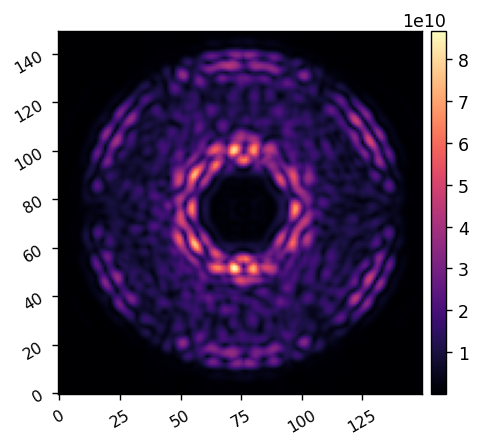

In [59]:
response_sum = np.sum(abs(response_cube), axis=(0,1))
misc.myimshow(response_sum.reshape(150,150))

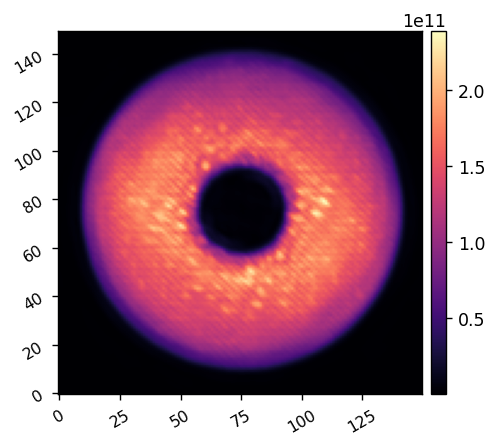

In [8]:
response_sum = np.sum(abs(response_cube), axis=(0,1))
misc.myimshow(response_sum.reshape(150,150))

# Create control matrix

In [34]:
reg_fun = iefc.construct_control_matrix
reg_conds = [[0, 15, 30],
             [(1e-1, 1e-1), (1e-2, 1e-2), (1e-3, 1e-3)]]
reg_conds = [[0],
             [(1e-1, 1e-1)]]
reg_conds = [[0, 15, 20, 30, 35,],
             [(1e-1, 1e-1), (1e-2, 1e-2), (1e-1, 1e-1), (1e-2, 1e-2), (1e-1, 1e-1)]]

# Run IEFC

Running I-EFC...
	Closed-loop iteration 1 / 50
	Computing EFC matrix via construct_control_matrix with condition values (0.1, 0.1)
Using Weighted Least Squares 


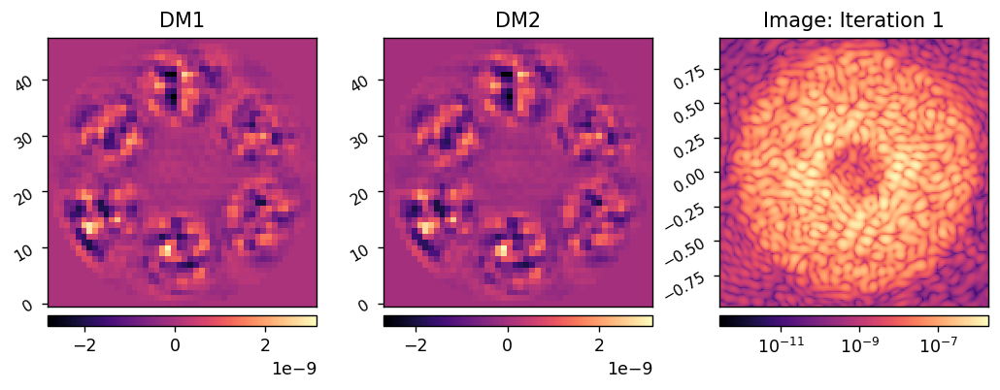

	Closed-loop iteration 2 / 50


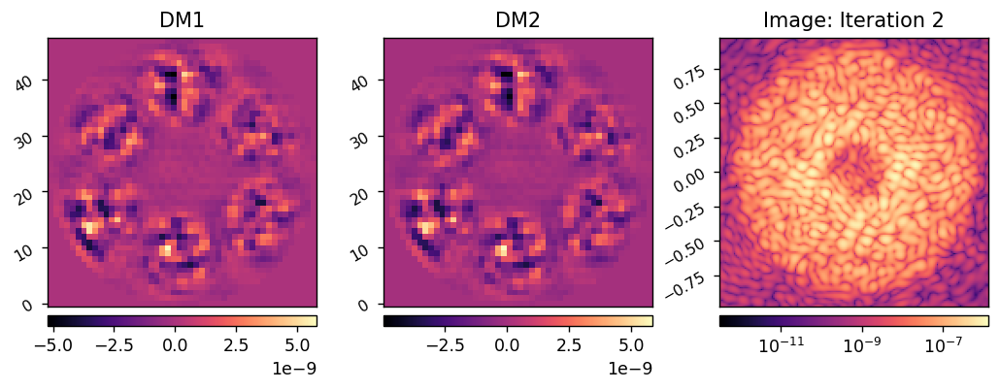

	Closed-loop iteration 3 / 50


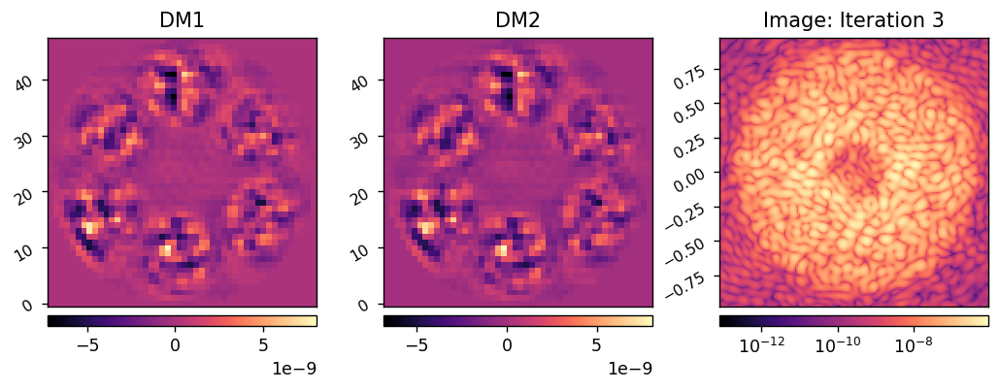

	Closed-loop iteration 4 / 50


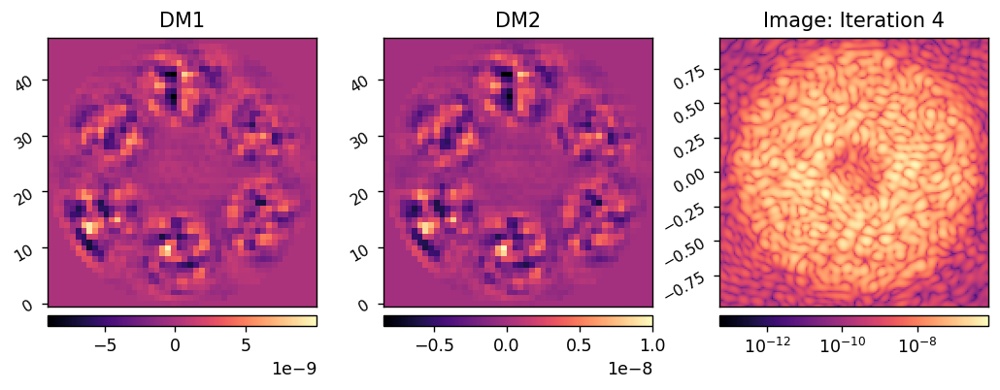

	Closed-loop iteration 5 / 50


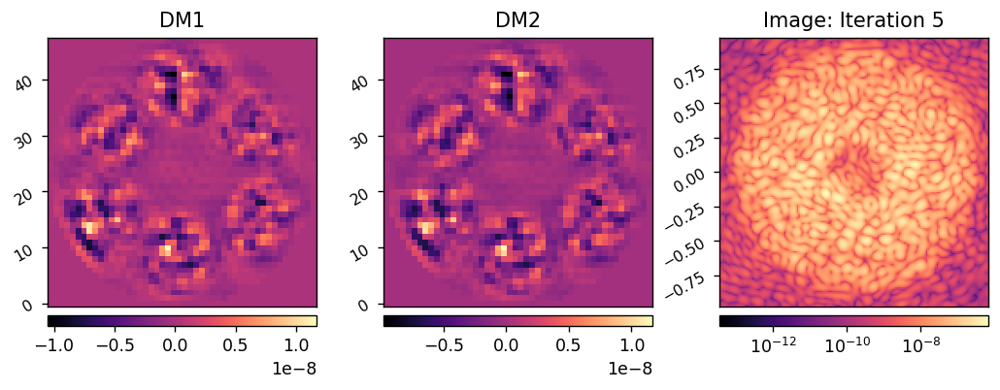

	Closed-loop iteration 6 / 50


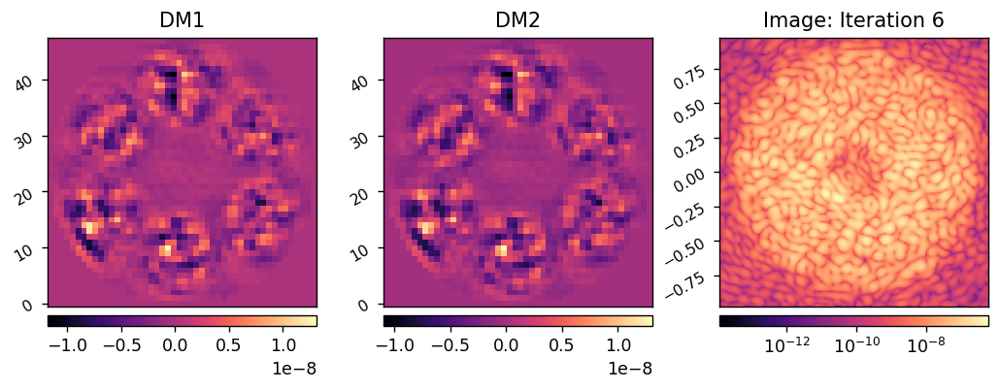

	Closed-loop iteration 7 / 50


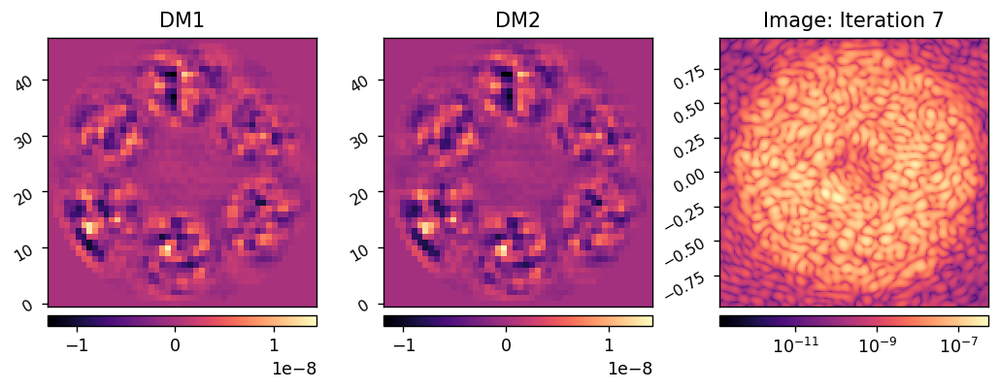

	Closed-loop iteration 8 / 50


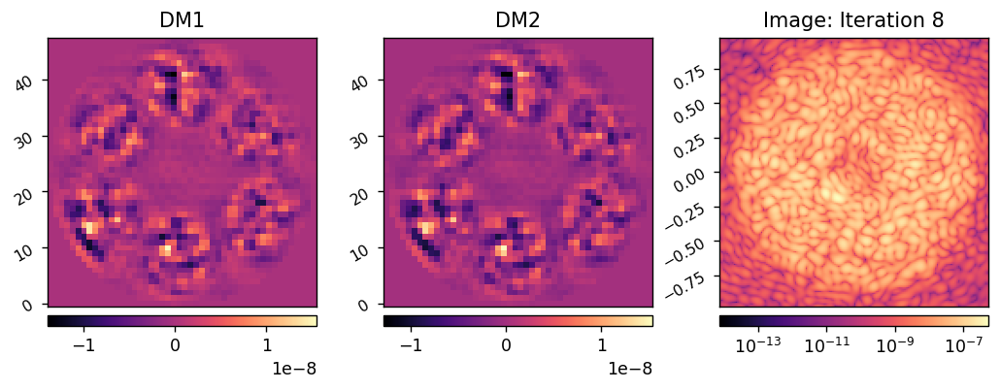

	Closed-loop iteration 9 / 50


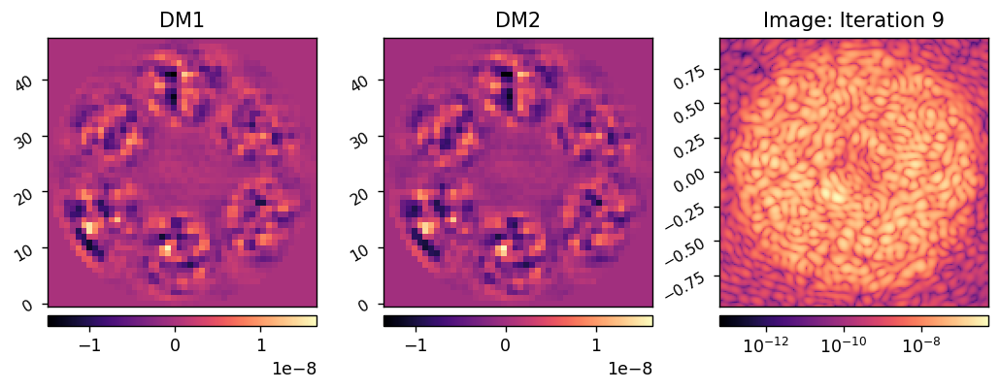

	Closed-loop iteration 10 / 50


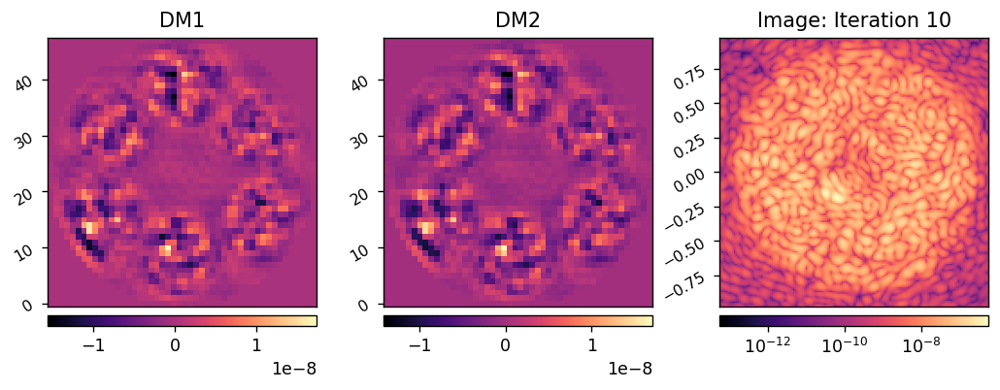

	Closed-loop iteration 11 / 50


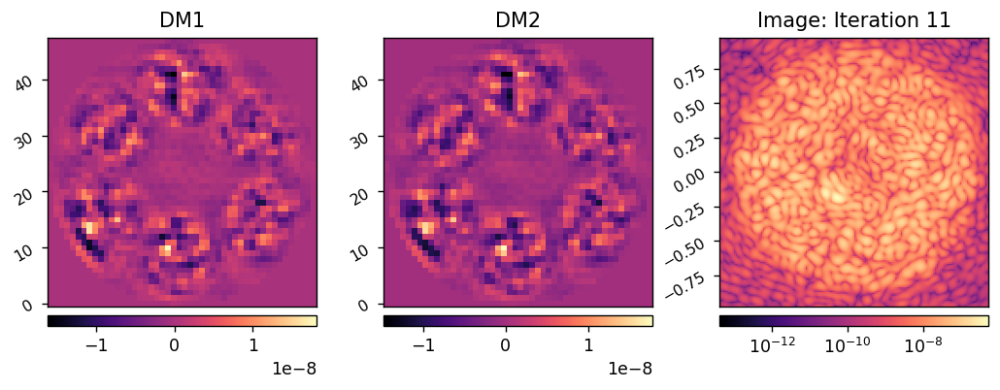

	Closed-loop iteration 12 / 50


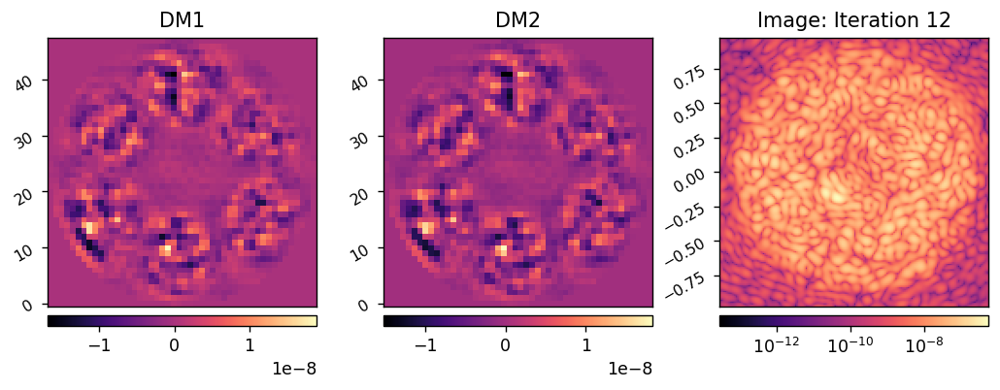

	Closed-loop iteration 13 / 50


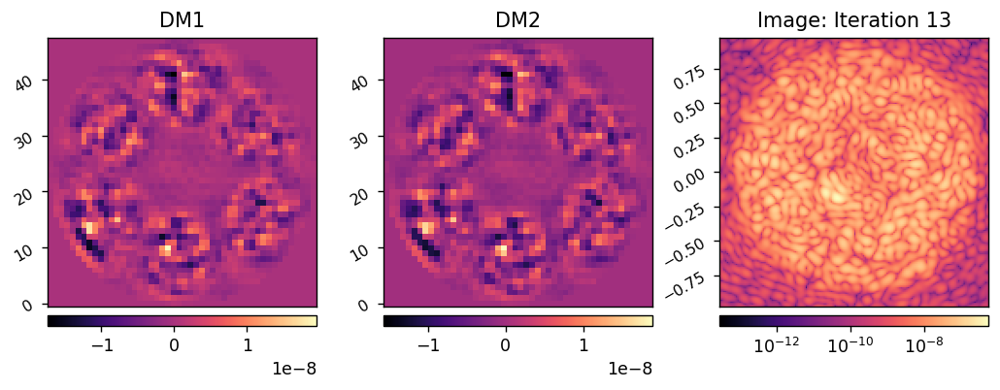

	Closed-loop iteration 14 / 50


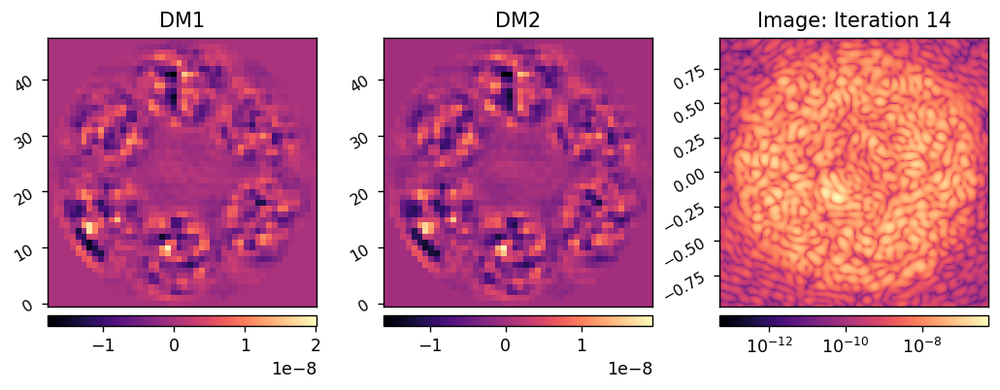

	Closed-loop iteration 15 / 50


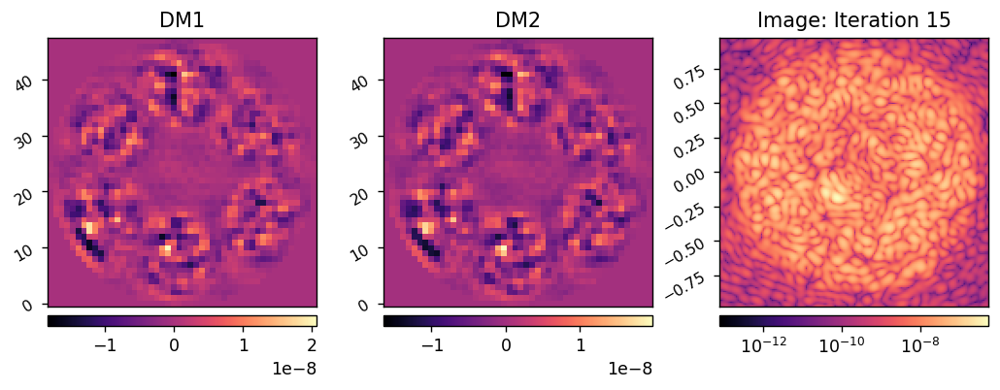

	Closed-loop iteration 16 / 50
	Computing EFC matrix via construct_control_matrix with condition values (0.01, 0.01)
Using Weighted Least Squares 


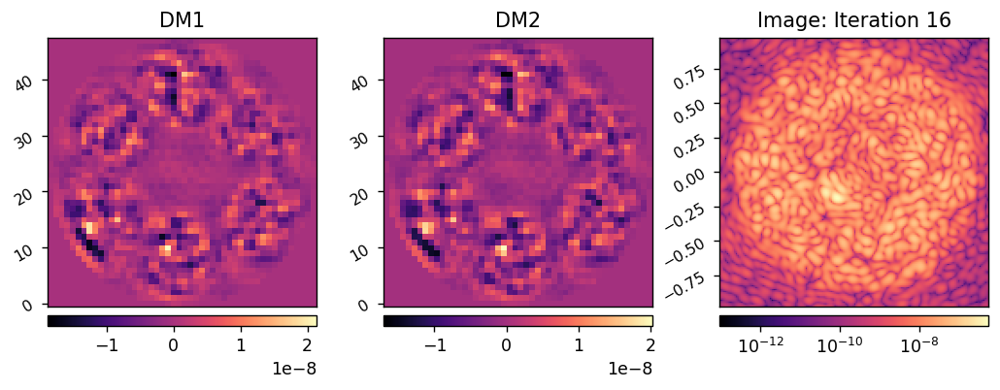

	Closed-loop iteration 17 / 50


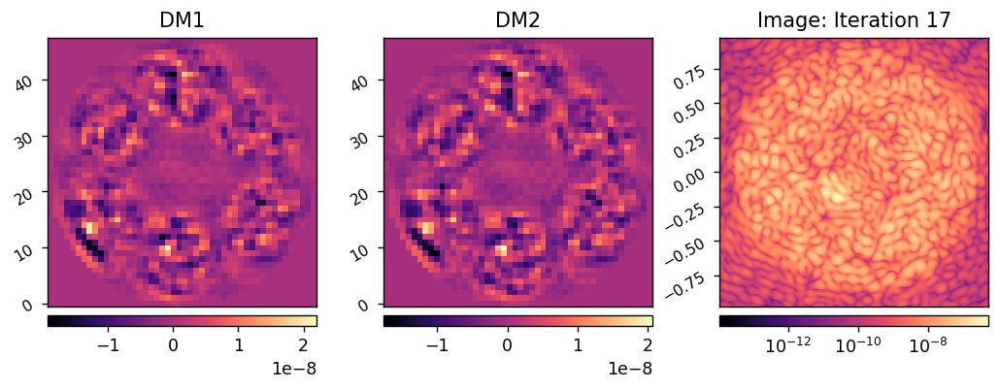

	Closed-loop iteration 18 / 50


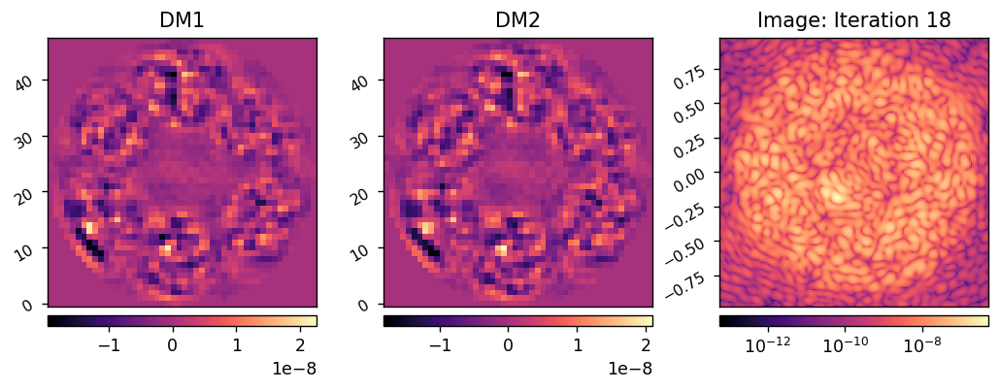

	Closed-loop iteration 19 / 50


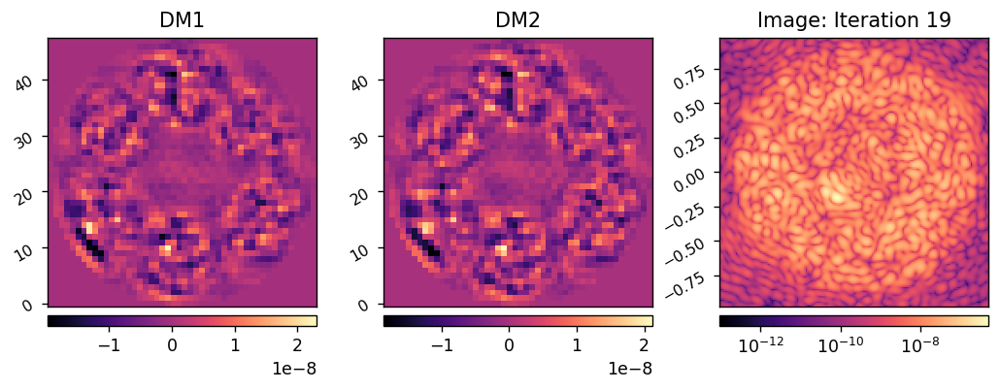

	Closed-loop iteration 20 / 50


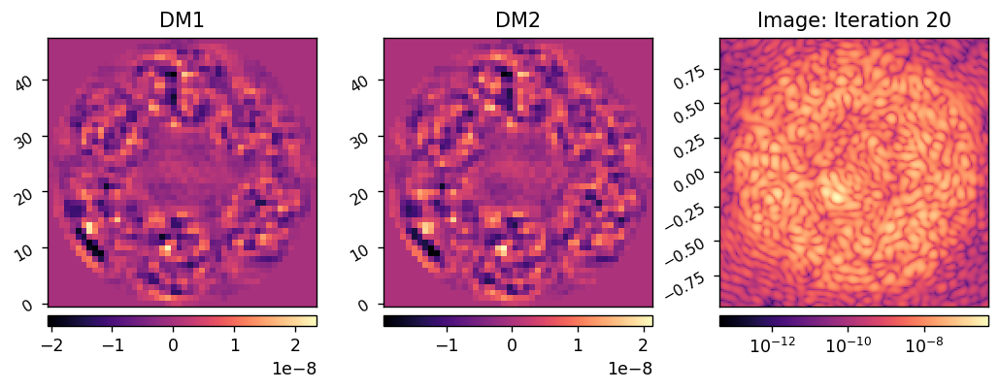

	Closed-loop iteration 21 / 50
	Computing EFC matrix via construct_control_matrix with condition values (0.1, 0.1)
Using Weighted Least Squares 


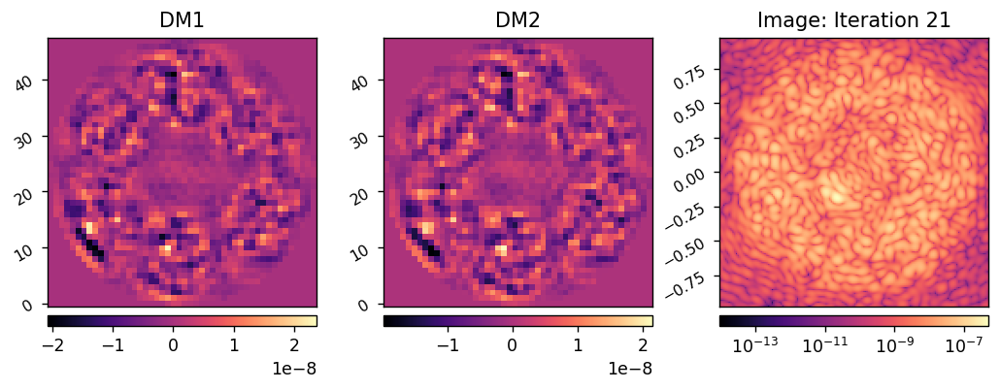

	Closed-loop iteration 22 / 50


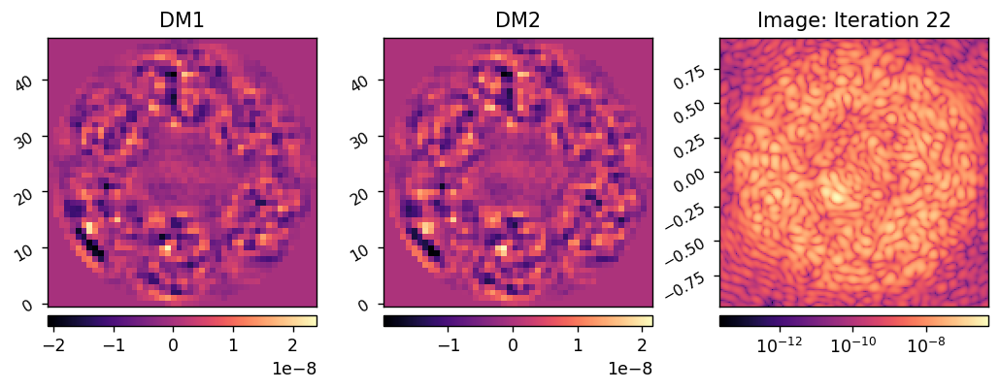

	Closed-loop iteration 23 / 50


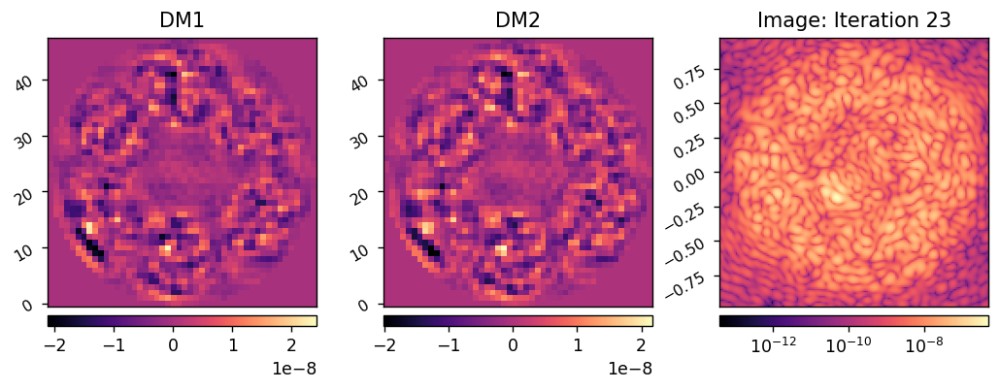

	Closed-loop iteration 24 / 50


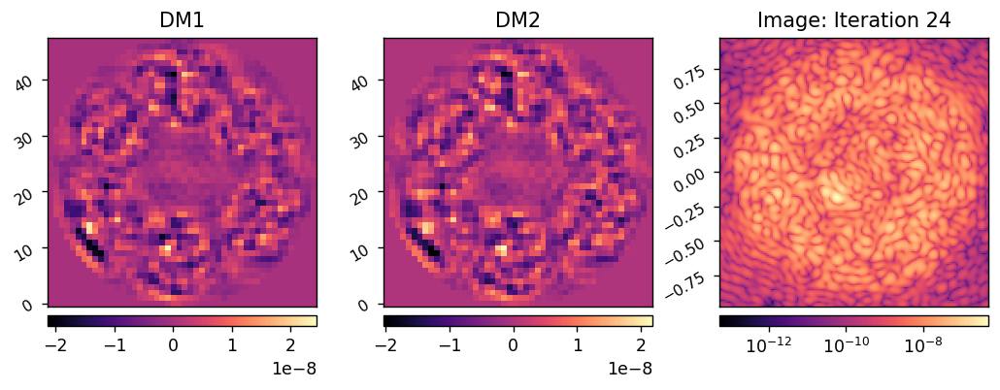

	Closed-loop iteration 25 / 50


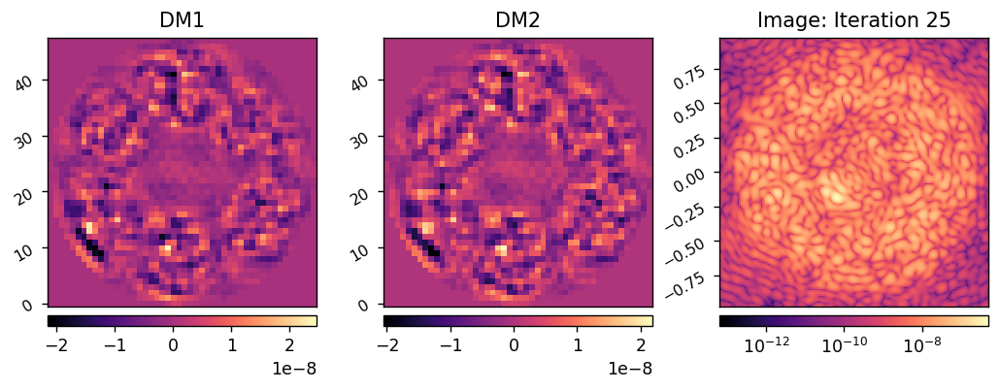

	Closed-loop iteration 26 / 50


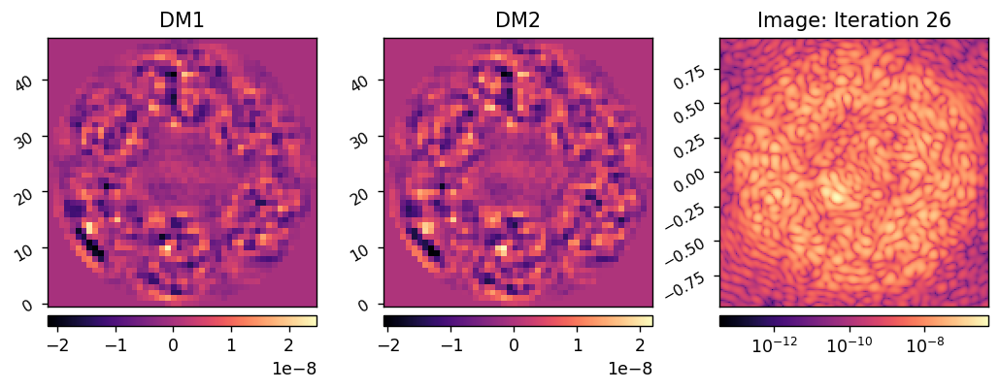

	Closed-loop iteration 27 / 50


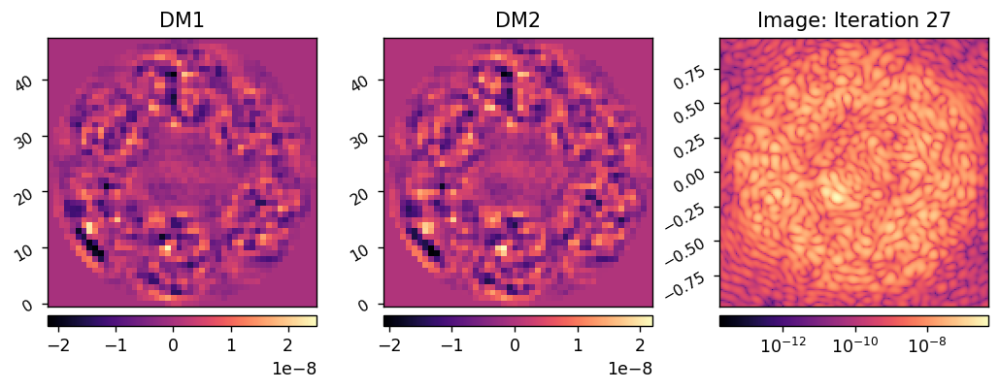

	Closed-loop iteration 28 / 50


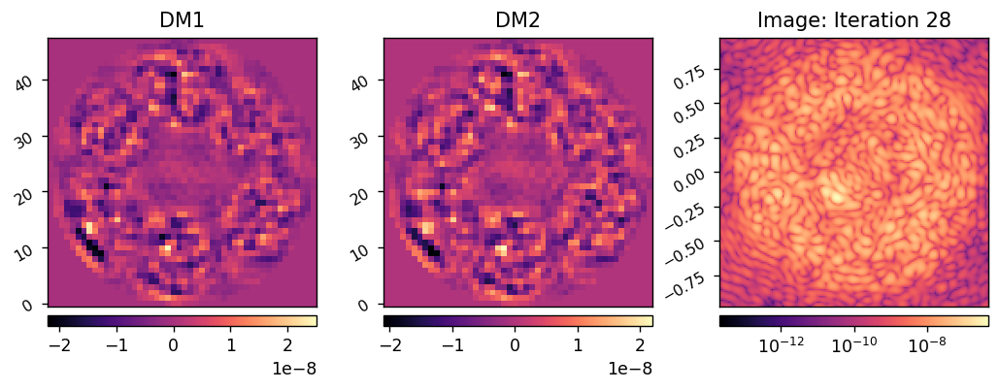

	Closed-loop iteration 29 / 50


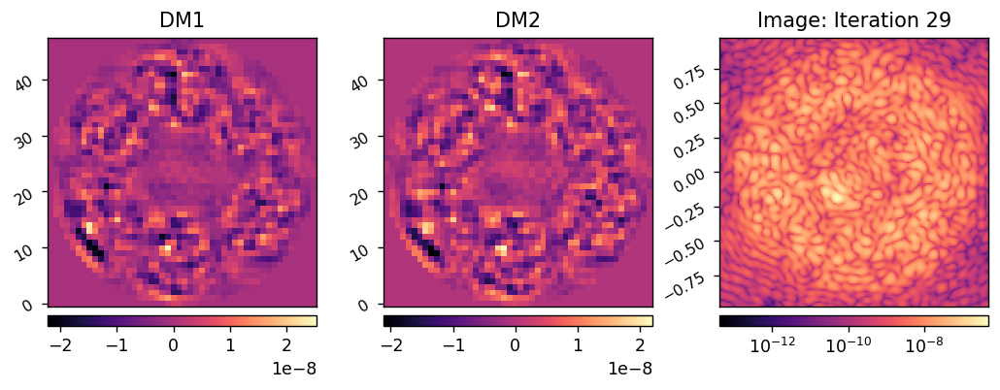

	Closed-loop iteration 30 / 50


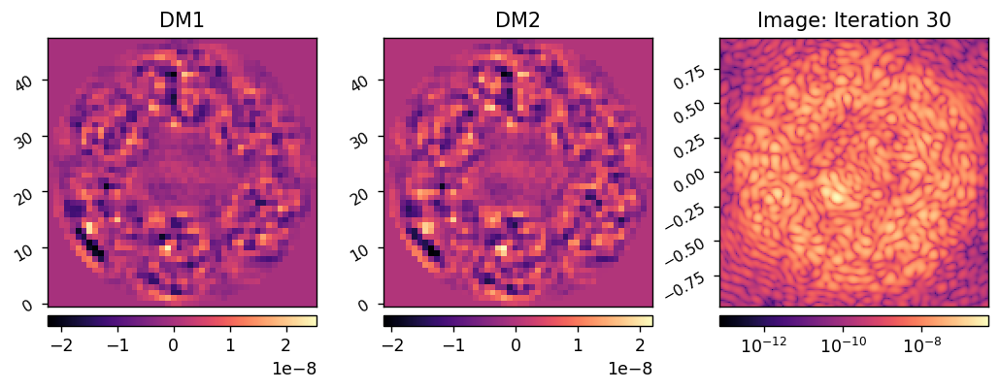

	Closed-loop iteration 31 / 50
	Computing EFC matrix via construct_control_matrix with condition values (0.01, 0.01)
Using Weighted Least Squares 


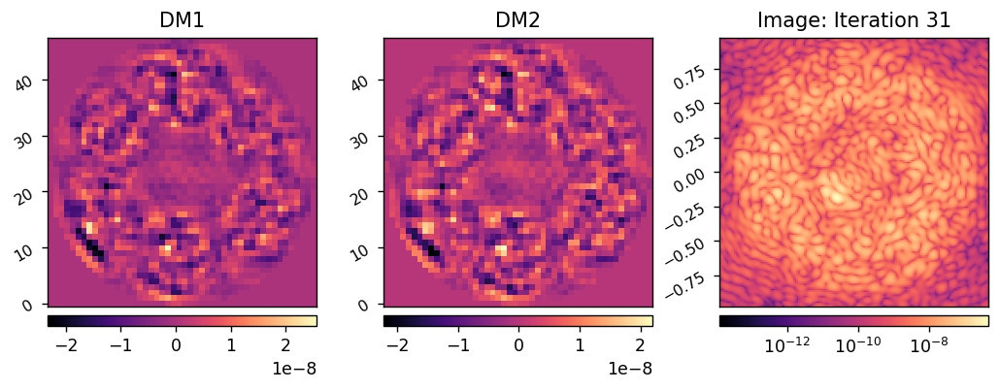

	Closed-loop iteration 32 / 50


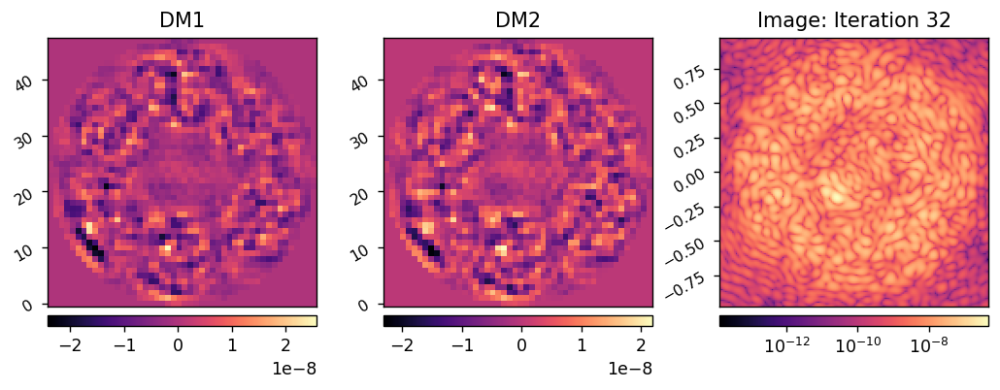

	Closed-loop iteration 33 / 50


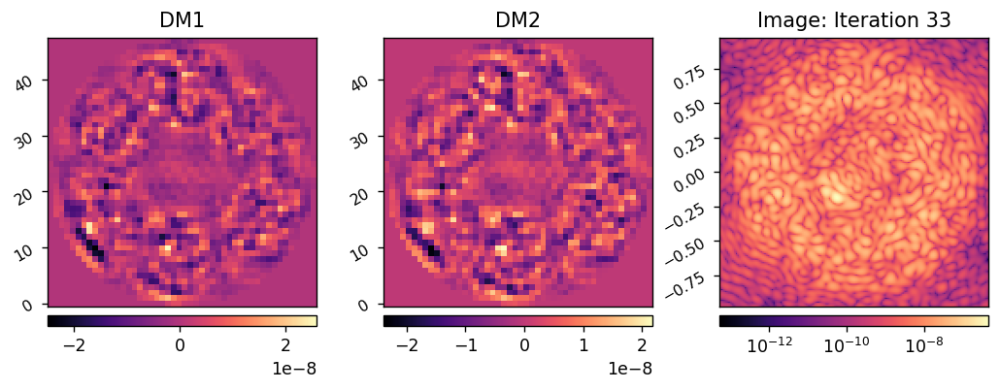

	Closed-loop iteration 34 / 50


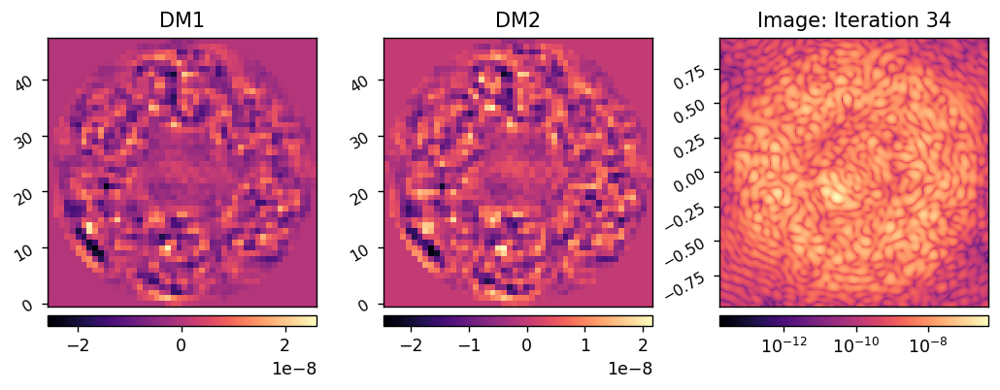

	Closed-loop iteration 35 / 50


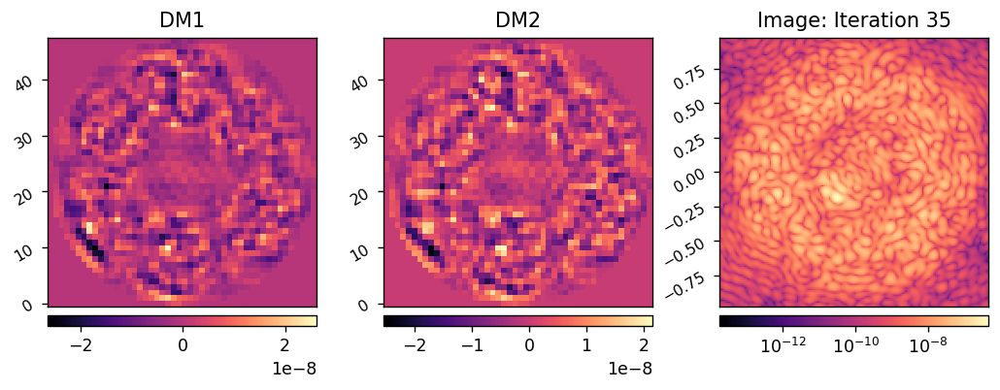

	Closed-loop iteration 36 / 50
	Computing EFC matrix via construct_control_matrix with condition values (0.1, 0.1)
Using Weighted Least Squares 


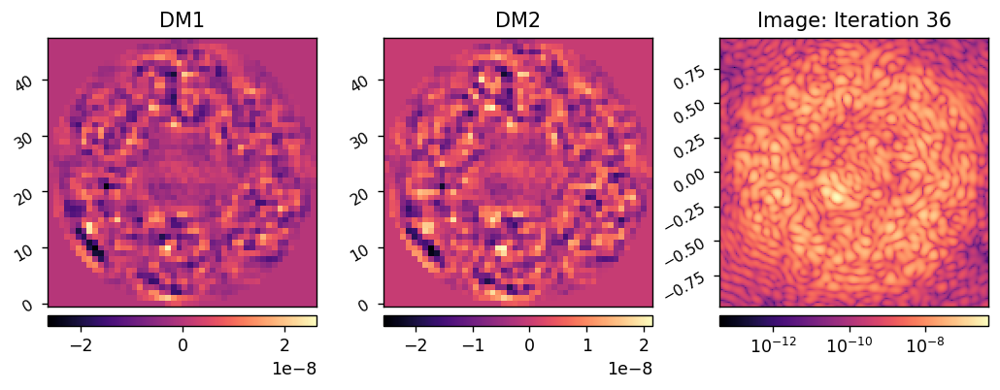

	Closed-loop iteration 37 / 50


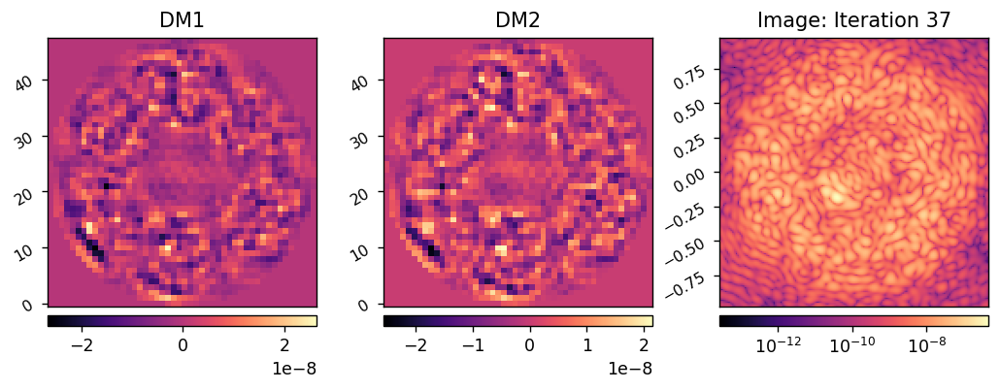

	Closed-loop iteration 38 / 50


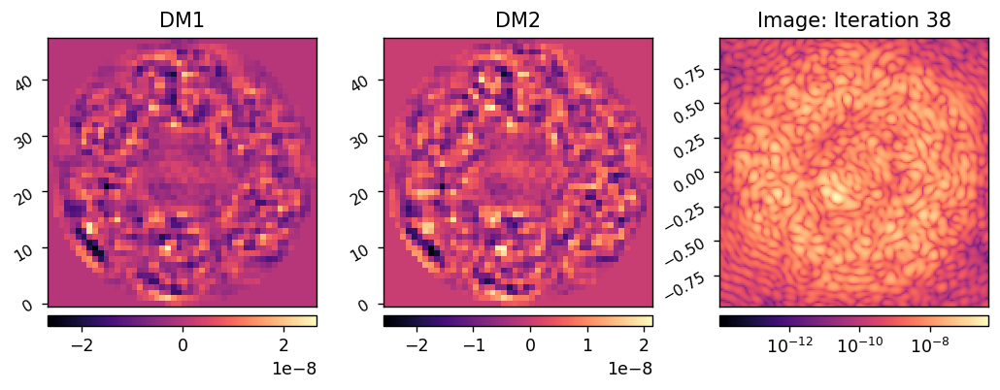

	Closed-loop iteration 39 / 50


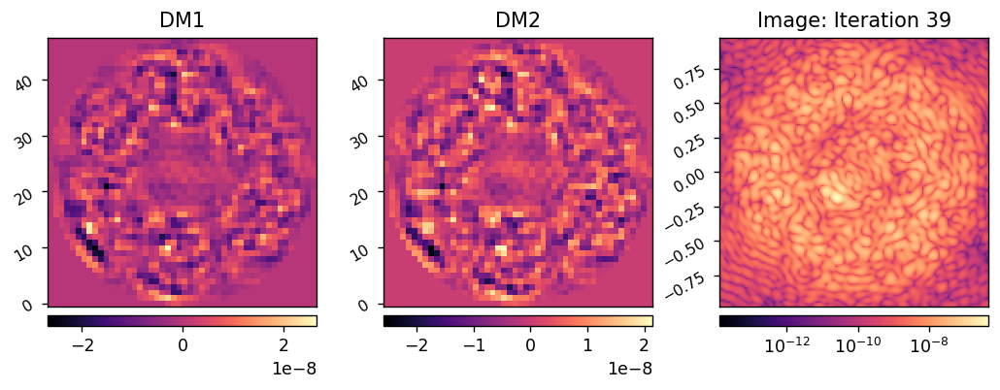

	Closed-loop iteration 40 / 50


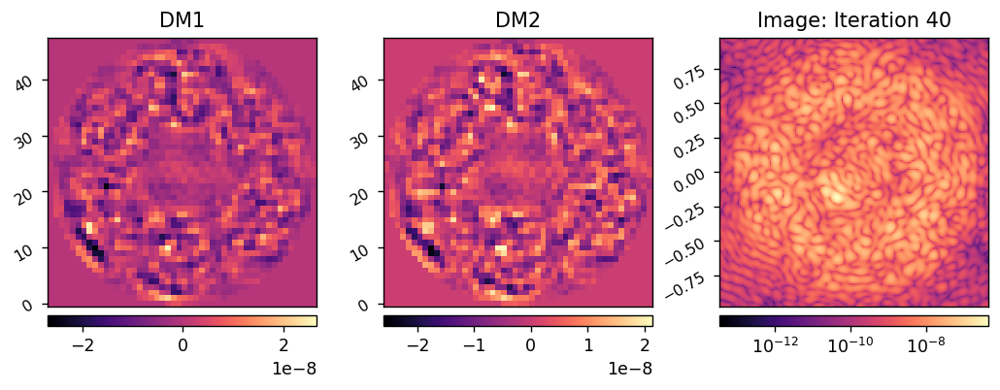

	Closed-loop iteration 41 / 50


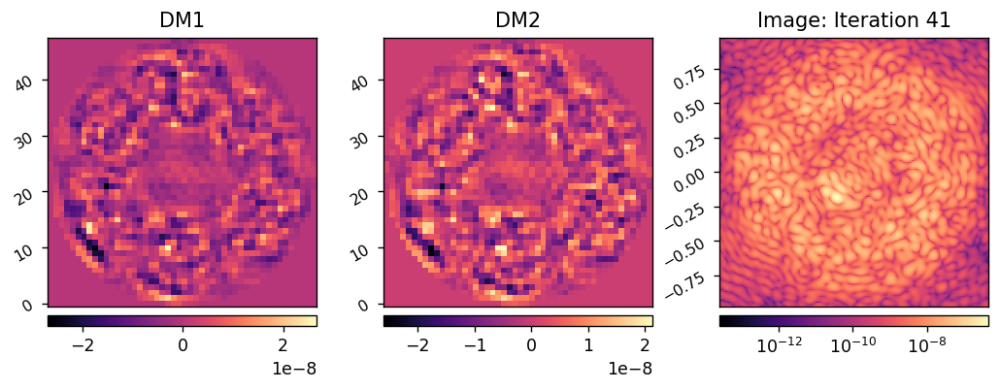

	Closed-loop iteration 42 / 50


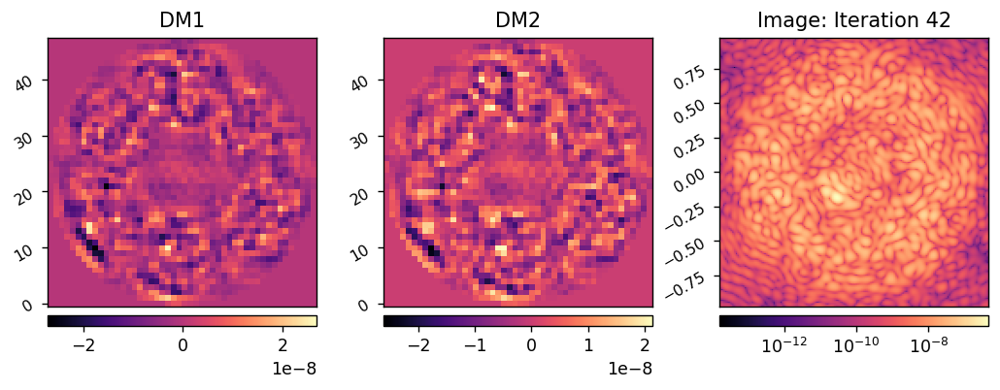

	Closed-loop iteration 43 / 50


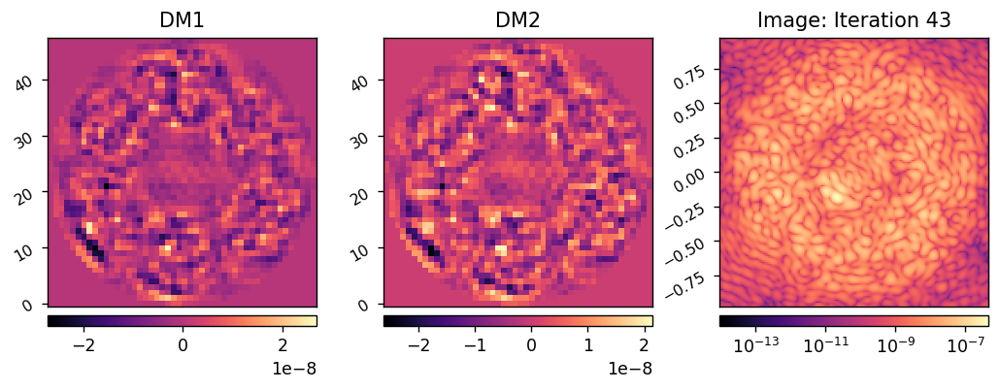

	Closed-loop iteration 44 / 50


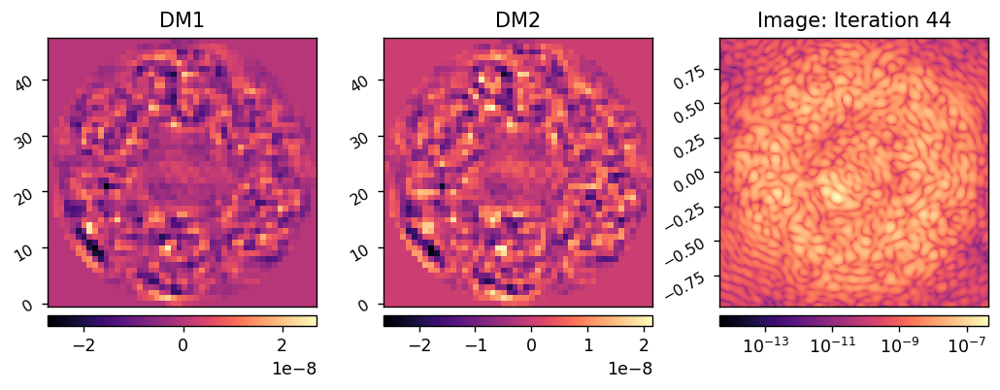

	Closed-loop iteration 45 / 50


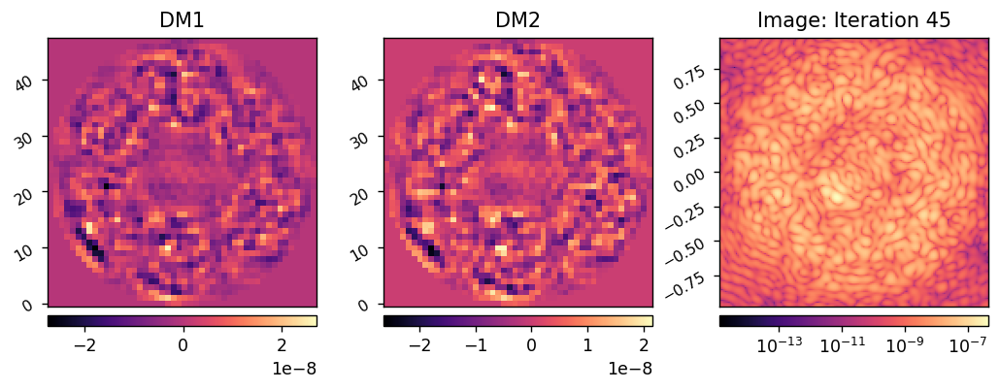

	Closed-loop iteration 46 / 50


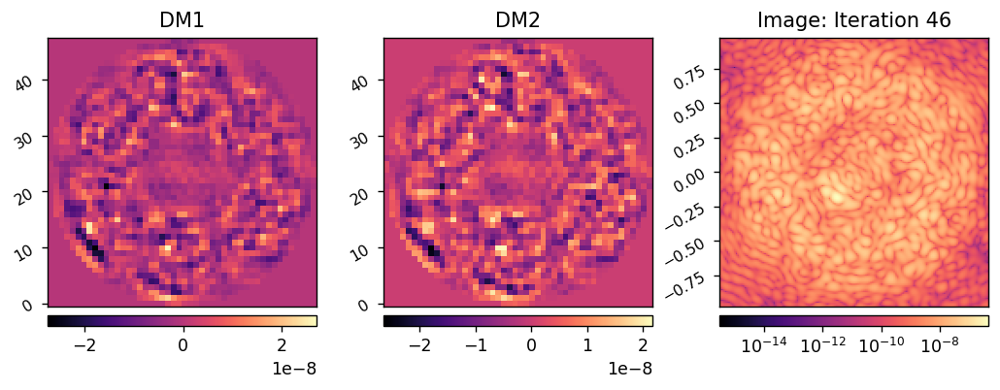

	Closed-loop iteration 47 / 50


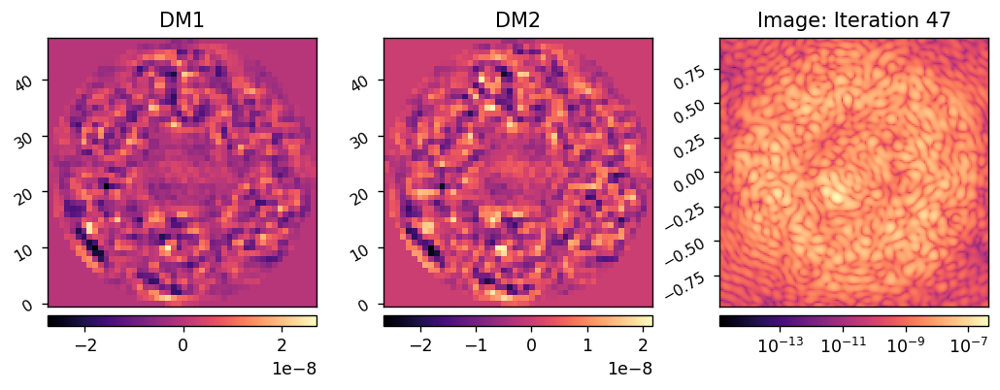

	Closed-loop iteration 48 / 50


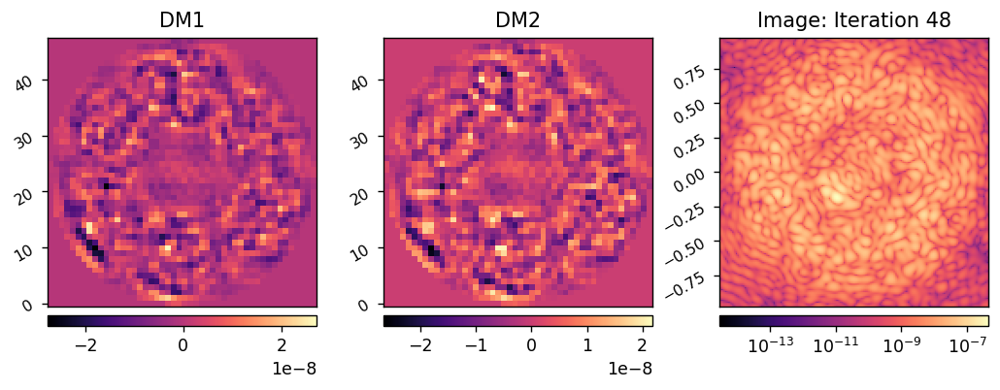

	Closed-loop iteration 49 / 50


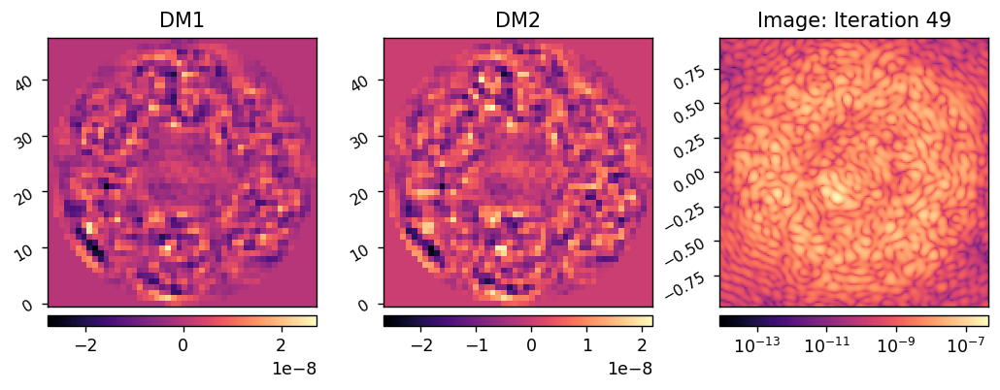

	Closed-loop iteration 50 / 50


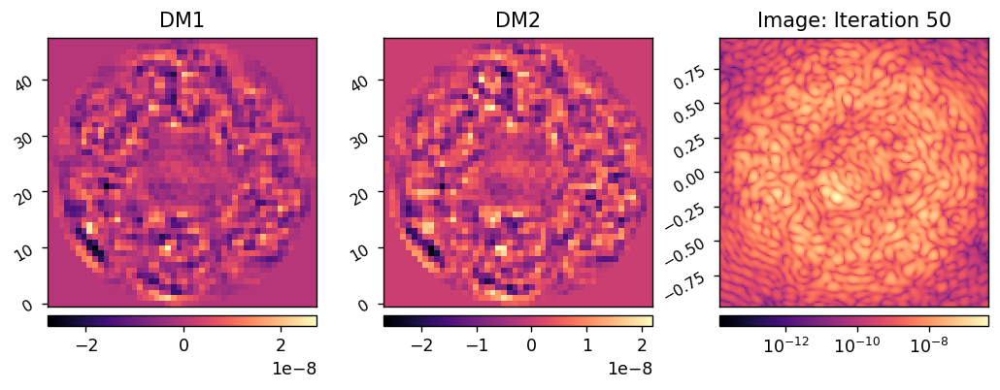

I-EFC loop completed in 1177.717s.


In [35]:
reload(iefc)

sysi.reset_dms()

images, dm1_commands, dm2_commands = iefc.run(sysi, 
                                              reg_fun,reg_conds,
                                              response_cube, 
                                              probe_modes, 
                                              probe_amplitude, 
                                              calibration_modes, 
                                              weights, 
                                              num_iterations=50, 
                                              loop_gain=0.1, leakage=0.0,
                                              display_all=True,
                                             )

In [163]:
iefcu.save_pickle(data_dir/'image-results'/fname, images)
iefcu.save_pickle(data_dir/'dm-results'/fname, dm_commands)

Saved wavefronts to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/image-results/dshaped_Yopds_polaxis0_iwa3.0_owa6.0
Saved wavefronts to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/dm-results/dshaped_Yopds_polaxis0_iwa3.0_owa6.0
